<a href="https://colab.research.google.com/github/jonbaer/googlecolab/blob/master/Stable_Diffusion_with_ImaginAIry.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ImaginAIry 🤖🧠

AI imagined images

Tends to crash if you try to do a non-inpainting and then inpainting generation (or vice versa).

The Stable Diffusion v2.0 model is too big to run in this colab.

https://github.com/brycedrennan/imaginAIry

In [ ]:
#@title Install ImaginAIry (will restart the notebook. ignore session failure messages)
# having torchtext installed caused an issue
!pip uninstall -y torchtext pillow

# default pillow version was too old (7.2.x)
!pip install imaginairy==8.* pillow --upgrade

# display GPU is setup
!nvidia-smi -L
!pip freeze | grep -i pillow

# restart the runtim
print("RESTARTING THE RUNTIME.")
import os
os._exit(0)


Found existing installation: torchtext 0.14.1
Uninstalling torchtext-0.14.1:
  Successfully uninstalled torchtext-0.14.1
Found existing installation: Pillow 7.1.2
Uninstalling Pillow-7.1.2:
  Successfully uninstalled Pillow-7.1.2
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.5/6.5 MB 54.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 28.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 KB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 825.8/825.8 KB 39.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 512.4/512.4 KB 13.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 549.1/549.1 KB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.6/41.6 KB 991.6 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 KB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
from imaginairy import imagine, imagine_image_files, ImaginePrompt, WeightedPrompt, LazyLoadingImage
from imaginairy.log_utils import configure_logging

configure_logging()
# trigger downloads via throw-away image generation
list(imagine(ImaginePrompt("", width=64, height=64, steps=3, negative_prompt="")))

Generating 🖼  1/1: "" 64x64px negative-prompt:"" seed:946982478 prompt-strength:7.5 steps:3 sampler-type:k_dpmpp_2m
Loading model /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/889b629140e71758e1e0006e355c331a5744b4bf/v1-5-pruned-emaonly.ckpt onto cuda backend...


  0%|          | 0/3 [00:00<?, ?it/s]

    Image Generated. Timings: conditioning:2.72s sampling:3.73s decoding:0.34s safety-filter:10.77s total:17.62s


Generating 🖼  1/1: "abstract desktop wallpaper" 512x512px negative-prompt:"Ugly, duplication, duplicates, mutilation, deformed, mutilated, mutation, twisted body, disfigured, bad anatomy, out of frame, extra fingers, mutated hands, poorly drawn hands, extra limbs, malformed limbs, missing arms, extra arms, missing legs, extra legs, mutated hands, extra hands, fused fingers, missing fingers, extra fingers, long neck, small head, closed eyes, rolling eyes, weird eyes, smudged face, blurred face, poorly drawn face, mutation, mutilation, cloned face, strange mouth, grainy, blurred, blurry, writing, calligraphy, signature, text, watermark, bad art," seed:452092440 prompt-strength:7.5 steps:15 sampler-type:k_dpmpp_2m


  0%|          | 0/15 [00:00<?, ?it/s]

    Image Generated. Timings: conditioning:0.05s sampling:3.23s decoding:0.28s safety-filter:1.75s total:5.53s


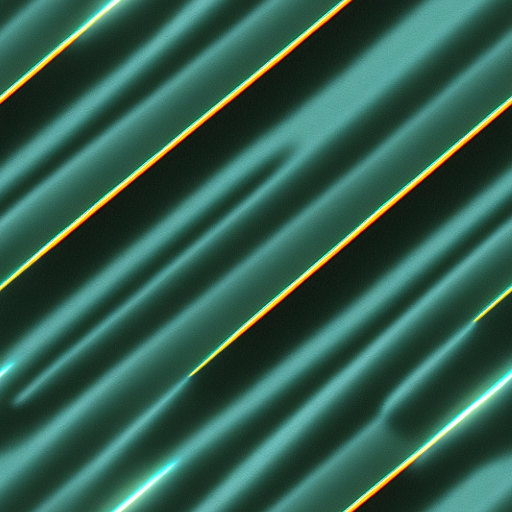

In [ ]:
#@title Make an Image!
# possible the first image doesn't work. try again if that happens
prompts = [
    ImaginePrompt("abstract desktop wallpaper", tile_mode=True),
]
for result in imagine(prompts):
    display(result.img)

In [ ]:
#@title Edit a picture using only words!
# will download the inpainting model
p = ImaginePrompt(
    f"make it halloween", 
    prompt_strength=15,
    init_image=LazyLoadingImage(url="https://raw.githubusercontent.com/brycedrennan/imaginAIry/master/assets/mask_examples/pearl000.jpg"),
    init_image_strength=1,
    model="edit"
)
prompts = [p]
for result in imagine(prompts):
    display(result.img)

NameError: ignored

Generating 🖼  1/3: "a bowl of fruit" 512x512px seed:631098142 prompt-strength:7.5 steps:15 sampler-type:k_dpmpp_2m


  0%|          | 0/15 [00:00<?, ?it/s]

    Image Generated. Timings: conditioning:0.03s sampling:3.61s safety-filter:2.70s total:6.73s


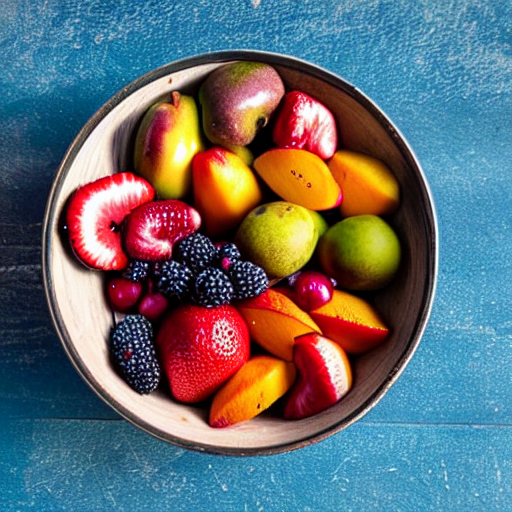

Generating 🖼  2/3: "1*(cat)|1*(bird)" 512x512px seed:25 prompt-strength:7.5 steps:50 sampler-type:k_dpmpp_2m


  0%|          | 0/50 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [ ]:
#@title Make some more images
prompts = [
    ImaginePrompt("a bowl of fruit", steps=15, seed=631098142, sampler_type="k_dpmpp_2m"),
    ImaginePrompt([
        WeightedPrompt("cat", weight=1),
        WeightedPrompt("bird", weight=1),
      ],
      seed=25,
      sampler_type="k_dpmpp_2m"
    ),
    ImaginePrompt("professional headshot photo of a happy couple", seed=941070420, fix_faces=True, sampler_type="k_dpmpp_2m")
]
for result in imagine(prompts):
    if result.upscaled_img:
      display(result.upscaled_img)
    else:
      display(result.img)

Generating 🖼  1/1: "a scenic mountain meadow landscape" 640x384px seed:1 prompt-strength:7.5 steps:50 sampler-type:k_dpmpp_2m


  0%|          | 0/50 [00:00<?, ?it/s]

    Upscaling 🖼  using real-ESRGAN...
    Image Generated. Timings: conditioning:0.03s sampling:10.91s safety-filter:2.72s total:17.65s


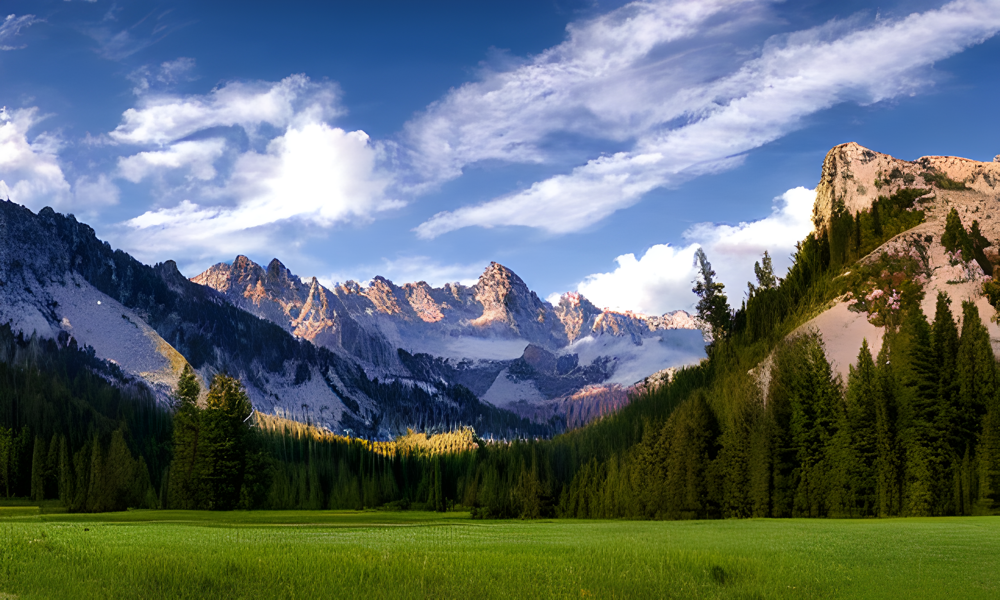

In [ ]:
#@title Make a Big Image

prompts = [
    ImaginePrompt("a scenic mountain meadow landscape", seed=1, width=512+128, height=512-128, upscale=True, sampler_type="k_dpmpp_2m"),
]
for result in imagine(prompts):
    if result.upscaled_img:
      display(result.upscaled_img)
    else:
      display(result.img)

Generating 🖼  1/10: "a white bowl filled with gold coins. sharp focus" 512x512px seed:1 prompt-strength:12 steps:15 sampler-type:k_dpmpp_2m
    Loaded input 🖼  of size (512, 512) from https://raw.githubusercontent.com/brycedrennan/imaginAIry/master/assets/000056_293284644_PLMS40_PS7.5_photo_of_a_bowl_of_fruit.jpg


  0%|          | 0/12 [00:00<?, ?it/s]

    Image Generated. Timings: conditioning:0.03s sampling:2.62s safety-filter:2.45s total:10.45s


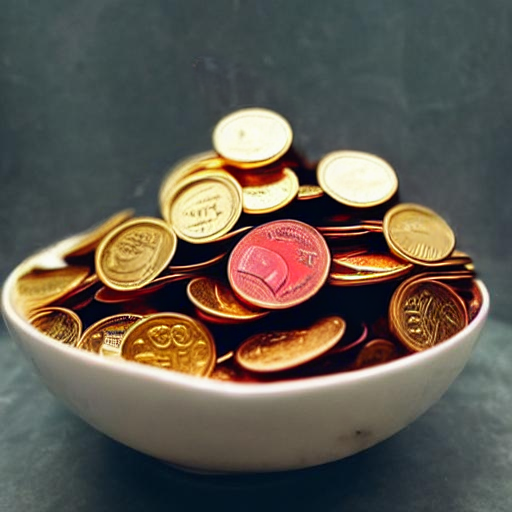

Generating 🖼  2/10: "a white bowl filled with m&ms. sharp focus" 512x512px seed:1 prompt-strength:12 steps:15 sampler-type:k_dpmpp_2m


  0%|          | 0/12 [00:00<?, ?it/s]

    Image Generated. Timings: conditioning:0.03s sampling:2.62s safety-filter:2.51s total:10.50s


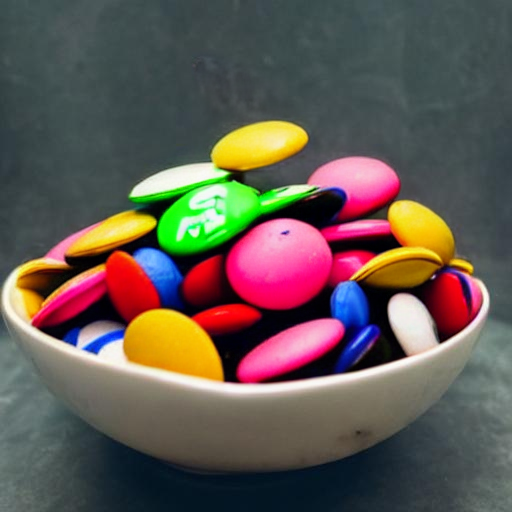

Generating 🖼  3/10: "a white bowl filled with flames. sharp focus" 512x512px seed:1 prompt-strength:12 steps:15 sampler-type:k_dpmpp_2m


  0%|          | 0/12 [00:00<?, ?it/s]

    Image Generated. Timings: conditioning:0.03s sampling:2.66s safety-filter:2.51s total:10.48s


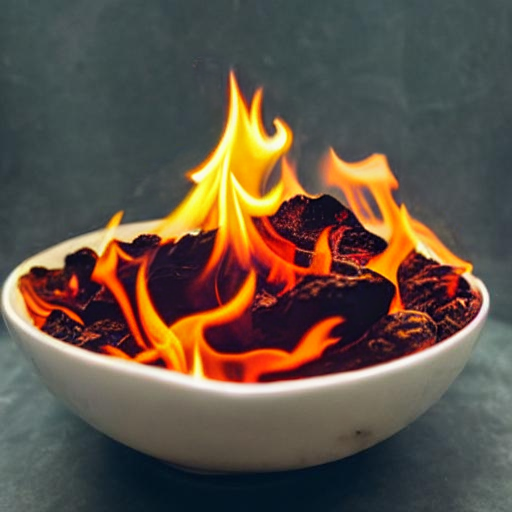

Generating 🖼  4/10: "a white bowl filled with tomato soup. sharp focus" 512x512px seed:1 prompt-strength:12 steps:15 sampler-type:k_dpmpp_2m


  0%|          | 0/12 [00:00<?, ?it/s]

    Image Generated. Timings: conditioning:0.05s sampling:2.67s safety-filter:2.45s total:10.44s


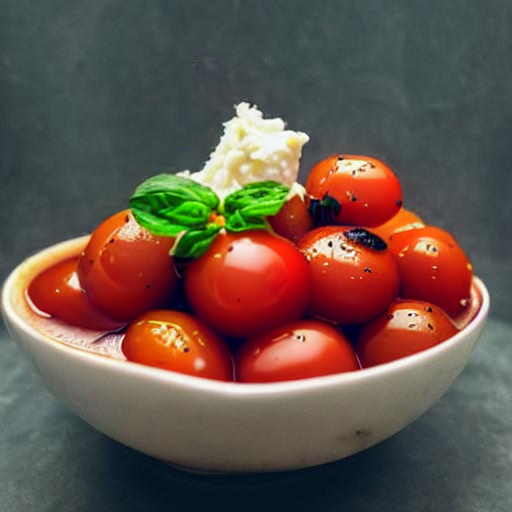

Generating 🖼  5/10: "a white bowl filled with kittens. sharp focus" 512x512px seed:1 prompt-strength:12 steps:15 sampler-type:k_dpmpp_2m


  0%|          | 0/12 [00:00<?, ?it/s]

    Image Generated. Timings: conditioning:0.03s sampling:2.65s safety-filter:2.41s total:10.41s


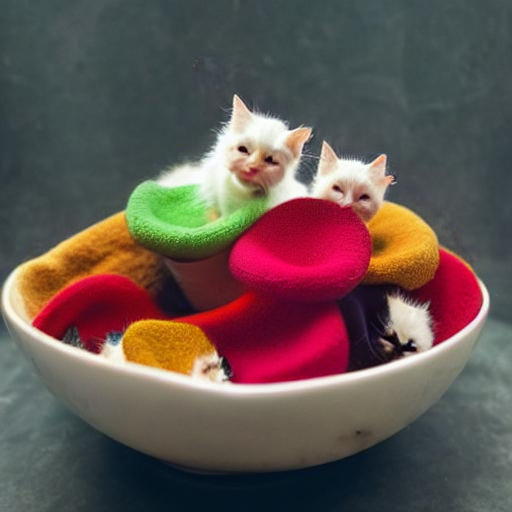

Generating 🖼  6/10: "a white bowl filled with large gemstones. sharp focus" 512x512px seed:1 prompt-strength:12 steps:15 sampler-type:k_dpmpp_2m


  0%|          | 0/12 [00:00<?, ?it/s]

    Image Generated. Timings: conditioning:0.04s sampling:2.69s safety-filter:2.46s total:10.45s


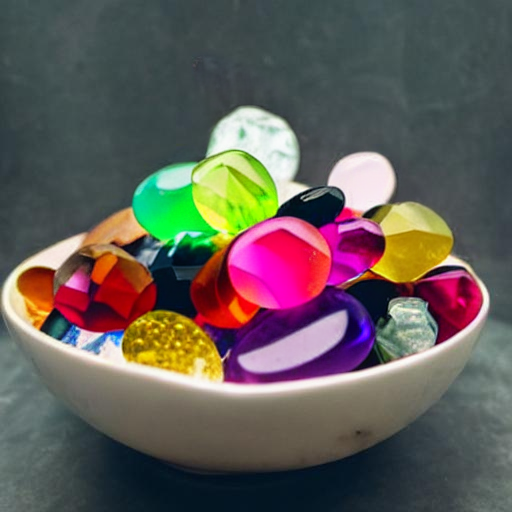

Generating 🖼  7/10: "a white bowl filled with red smoke. sharp focus" 512x512px seed:1 prompt-strength:12 steps:15 sampler-type:k_dpmpp_2m


  0%|          | 0/12 [00:00<?, ?it/s]

    Image Generated. Timings: conditioning:0.03s sampling:2.68s safety-filter:2.48s total:10.42s


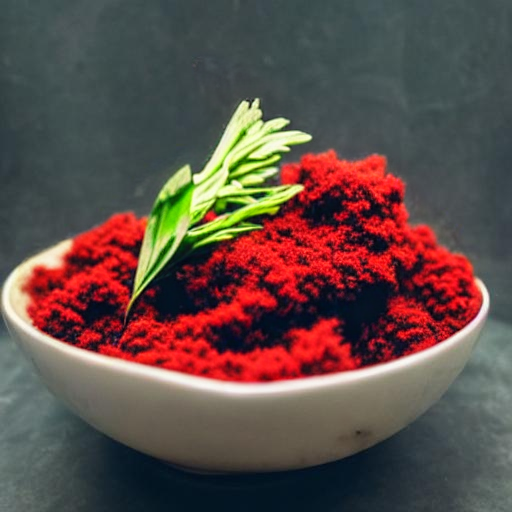

Generating 🖼  8/10: "a white bowl filled with soap bubbles. sharp focus" 512x512px seed:1 prompt-strength:12 steps:15 sampler-type:k_dpmpp_2m


  0%|          | 0/12 [00:00<?, ?it/s]

    Image Generated. Timings: conditioning:0.04s sampling:2.71s safety-filter:2.47s total:10.56s


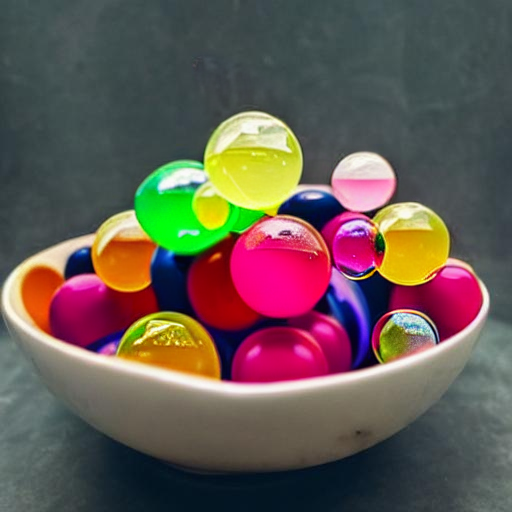

Generating 🖼  9/10: "a white bowl filled with fruit loops. sharp focus" 512x512px seed:1 prompt-strength:12 steps:15 sampler-type:k_dpmpp_2m


  0%|          | 0/12 [00:00<?, ?it/s]

        ⚠️  Filtering NSFW image. nsfw score: 0.008
    Image Generated. Timings: conditioning:0.03s sampling:2.74s safety-filter:2.56s total:10.75s


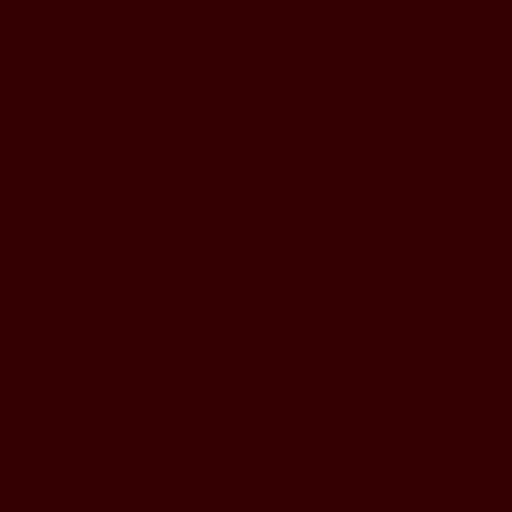

Generating 🖼  10/10: "a white bowl filled with christmas lights. sharp focus" 512x512px seed:1 prompt-strength:12 steps:15 sampler-type:k_dpmpp_2m


  0%|          | 0/12 [00:00<?, ?it/s]

    Image Generated. Timings: conditioning:0.04s sampling:2.74s safety-filter:2.51s total:10.58s


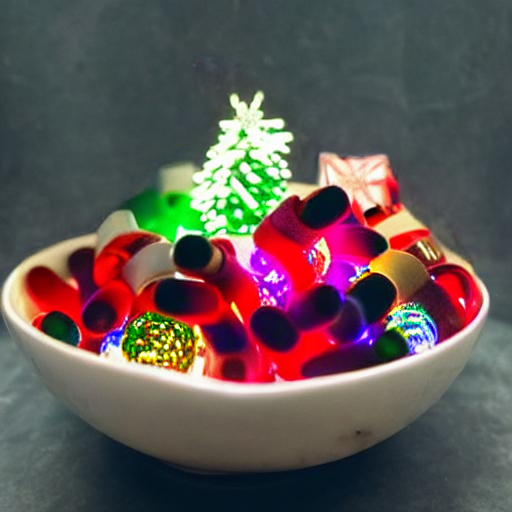

In [ ]:
#@title Replace fruit with various things using text prompt masking
import random
fun_items = [
    "gold coins", "m&ms", "flames", 
    "tomato soup", "kittens", "large gemstones", 
    "red smoke", "soap bubbles", "fruit loops", 
    "christmas lights",
]
prompts = []

# seed = random.randint(0, 2**64)

img = LazyLoadingImage(url="https://raw.githubusercontent.com/brycedrennan/imaginAIry/master/assets/000056_293284644_PLMS40_PS7.5_photo_of_a_bowl_of_fruit.jpg")

for fun_item in fun_items:
    prompt = ImaginePrompt(
        f"a white bowl filled with {fun_item}. sharp focus", 
        prompt_strength=12,
        init_image=img,
        init_image_strength=0.1,
        mask_prompt="(fruit{*1.5} OR stem{*10}{+20} OR fruit stem{*3}{+5})",
        mask_mode="replace",
        steps=15,
        seed=1,
        sampler_type="k_dpmpp_2m"
    )
    prompts.append(prompt)

for result in imagine(prompts):
    display(result.img)
